# Part 6: Basic Panaromic Stitching

Implementation Details:
In the case of implementing Panaromic Stitching sequentially by stitching the panaromic canvas with every new image, a significant reduction in size of stitched images is observed. In order to overcome this challenge, one image is chosen to be the reference image to which other images are stitched. 
In the implementation below, image 3 is chosen to be the reference and there the homography matrix between each of the other images and image 3 is computed in order to stitch the images. 
Thus the homography matrices obtained are H13,H23,H43 and H53 where Hij is the matrix used to stitch image i to image j.
H13=H12* H23
H43=inverse(H34)
H53=inverse(H34* H45)

H12,H23,H34,H45 are computed by stitching imaage 1 to image 2,image 2 to image 3,image 3 to image 4 and image 4 to image 5 respectively.


# Stitching Image 1 to Image 2

In order to stitch image 1 to image 2, the sift keypoints and decriptors for each image is computed following which descriptors are used to compute all the matches between image 1 and image 2. The inliers are then extracted using RANSAC and are used to compute the homography matrix which is to be used to stitch image 1 to image 2.
Here image 1 is interpolated to a scale of 18 while image 2 is interpolated to a scale of 4.


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import numpy.linalg as lin

from skimage.transform import warp

C:\Users\Varshini\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [222]:
im1=cv2.imread('im01.jpg')
im2=cv2.imread('im02.jpg')

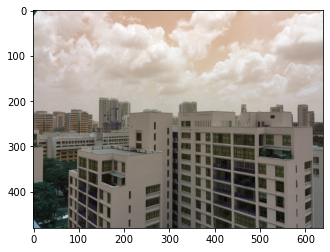

In [223]:
plt.imshow(im1)

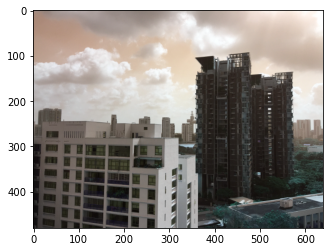

In [224]:
plt.imshow(im2)

Reading image 1 and image 2 and computing SIFT keypoints and descriptors:

In [332]:
im1=plt.imread('im01.jpg')
im1=cv2.resize(im1,(320,240))
img=im1.copy()
sift1 = cv2.SIFT_create()
gray_im1= cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)

kp1, des1 = sift1.detectAndCompute(im1,None)
img=cv2.drawKeypoints(im1,kp1,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


In [333]:
im2=plt.imread('im02.jpg')
im2=cv2.resize(im2,(320,240))
img1=im2.copy()
sift2 = cv2.SIFT_create()
gray_im2= cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

kp2, des2 = sift2.detectAndCompute(im2,None)
img1=cv2.drawKeypoints(im2,kp2,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

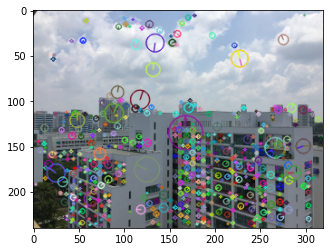

In [4]:
plt.imshow(img)

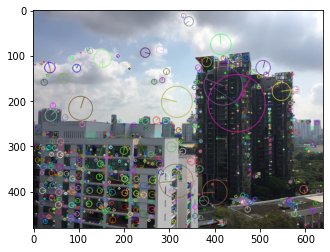

In [399]:
plt.imshow(img1)

In [567]:
des1.shape

(1567, 128)

In [ ]:
des2.shape

Obtaining matches for every descriptor:

In [223]:
threshold=1.5

In [224]:
best_match=1
(des1[0,:]-des2[0,:]).shape

(128,)

In [334]:
threshold=1.5
matches=[]
scores=[]
dist=[]
for i in range(0,des1.shape[0]):
    #print(i)
    closest_distance=1e10
    second_closest_dist=1e10
    best_match=None
    dist_temp=[]
    for j in range(0,des2.shape[0]):
        
        
        
        d = des1[i,:] - des2[j,:]
        
        squared_dist = np.sum(d**2)
        dist_temp.append(squared_dist)
        #print(squared_dist)
        if squared_dist<closest_distance:
#             print(j)
#             print(closest_distance)
#             print(squared_dist)
            
            second_closest_dist=closest_distance
            closest_distance=squared_dist
            best_match=j
        elif squared_dist<second_closest_dist:
            second_closest_dist=squared_dist
    if (threshold * closest_distance < second_closest_dist) and (best_match != None):
        #print(i)
        #print(j)
        matches.append([i,best_match])
        scores.append(closest_distance)
    dist.append(dist_temp)

In [6]:
min(dist[0])

73517.0

In [302]:
matches

[[10, 92],
 [61, 490],
 [148, 280],
 [235, 428],
 [236, 94],
 [277, 494],
 [278, 494],
 [279, 494],
 [282, 385],
 [290, 3],
 [301, 17],
 [306, 8],
 [321, 31],
 [326, 50],
 [335, 56],
 [350, 67],
 [352, 61],
 [354, 330],
 [357, 86],
 [360, 86],
 [362, 86],
 [363, 86],
 [369, 90],
 [383, 101],
 [387, 101],
 [391, 101],
 [395, 101],
 [397, 101],
 [400, 101],
 [402, 101],
 [406, 428],
 [407, 94],
 [409, 120],
 [414, 124],
 [420, 109],
 [421, 121],
 [434, 128],
 [436, 128],
 [437, 140],
 [439, 139],
 [442, 128],
 [444, 128],
 [449, 139],
 [450, 128],
 [455, 251],
 [457, 147],
 [459, 155],
 [463, 152],
 [470, 159],
 [472, 163],
 [474, 172],
 [475, 176],
 [476, 173],
 [479, 179],
 [483, 244],
 [484, 181],
 [485, 182],
 [487, 187],
 [490, 185],
 [493, 198],
 [497, 191],
 [498, 207],
 [499, 208],
 [504, 201],
 [511, 217],
 [513, 218],
 [519, 223],
 [520, 222],
 [523, 228],
 [525, 229],
 [533, 238],
 [534, 238],
 [536, 236],
 [537, 237],
 [538, 247],
 [539, 242],
 [543, 244],
 [546, 252],
 [547,

In [169]:
matches

[[1585, 678],
 [1584, 779],
 [1582, 981],
 [1581, 656],
 [1579, 653],
 [1578, 652],
 [1567, 688],
 [1564, 647],
 [1562, 654],
 [1558, 655],
 [1556, 659],
 [1554, 623],
 [1549, 625],
 [1531, 615],
 [1526, 628],
 [1521, 583],
 [1519, 642],
 [1503, 1137],
 [1501, 1222],
 [1492, 981],
 [1470, 562],
 [1468, 558],
 [1466, 574],
 [1465, 573],
 [1464, 558],
 [1459, 556],
 [1454, 565],
 [1453, 222],
 [1451, 222],
 [1441, 554],
 [1440, 554],
 [1435, 552],
 [1425, 493],
 [1424, 183],
 [1422, 183],
 [1421, 183],
 [1418, 542],
 [1412, 529],
 [1405, 531],
 [1404, 530],
 [1403, 532],
 [1398, 527],
 [1393, 507],
 [1391, 516],
 [1388, 514],
 [1386, 501],
 [1385, 515],
 [1383, 512],
 [1373, 500],
 [1371, 483],
 [1368, 493],
 [1367, 482],
 [1366, 494],
 [1365, 493],
 [1363, 496],
 [1362, 495],
 [1359, 488],
 [1358, 487],
 [1356, 484],
 [1352, 470],
 [1351, 472],
 [1349, 474],
 [1348, 478],
 [1347, 454],
 [1345, 333],
 [1339, 457],
 [1336, 465],
 [1334, 452],
 [1331, 456],
 [1329, 343],
 [1328, 459],
 [13

In [335]:
ind=np.argsort(np.array(scores))
matches1=[]
matches_img1=[]
matches_img2=[]
for i in ind:
    matches1.append(matches[i])
    matches_img1.append(matches[i][0])
    matches_img2.append(matches[i][1])

In [304]:
matches1

[[437, 140],
 [493, 198],
 [463, 152],
 [563, 271],
 [552, 259],
 [421, 121],
 [543, 244],
 [539, 242],
 [414, 124],
 [459, 155],
 [444, 128],
 [383, 101],
 [603, 307],
 [436, 128],
 [326, 50],
 [485, 182],
 [577, 278],
 [362, 86],
 [449, 139],
 [442, 128],
 [519, 223],
 [600, 308],
 [575, 279],
 [409, 120],
 [627, 327],
 [407, 94],
 [470, 159],
 [547, 248],
 [487, 187],
 [586, 288],
 [523, 228],
 [499, 208],
 [391, 101],
 [306, 8],
 [457, 147],
 [538, 247],
 [400, 101],
 [10, 92],
 [476, 173],
 [335, 56],
 [551, 257],
 [490, 185],
 [598, 294],
 [587, 282],
 [483, 244],
 [395, 101],
 [321, 31],
 [484, 181],
 [533, 238],
 [626, 325],
 [588, 283],
 [605, 309],
 [497, 191],
 [686, 375],
 [574, 280],
 [434, 128],
 [472, 163],
 [579, 276],
 [397, 101],
 [498, 207],
 [534, 238],
 [369, 90],
 [513, 218],
 [590, 288],
 [572, 159],
 [511, 217],
 [520, 222],
 [622, 323],
 [569, 191],
 [623, 323],
 [352, 61],
 [504, 201],
 [685, 10],
 [475, 176],
 [548, 250],
 [591, 296],
 [439, 139],
 [301, 17],

In [305]:
x1=[]
y1=[]
x2=[]
y2=[]
for i in range(0,len(matches1)):
    x1.append(kp1[matches1[i][0]].pt[0])
    y1.append(kp1[matches1[i][0]].pt[1])
    x2.append(kp2[matches1[i][1]].pt[0]+im2.shape[1])
    y2.append(kp2[matches1[i][1]].pt[1])
    

In [336]:
coordinates_im1=[]
coordinates_im2=[]
for i in range(0,len(matches1)):
    coordinates_im1.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1])])
    coordinates_im2.append([int(kp2[matches1[i][1]].pt[0]+im2.shape[1]),int(kp2[matches1[i][1]].pt[1])])
#     x1.append(kp1[matches1[i][0]].pt[0])
#     y1.append(kp1[matches1[i][0]].pt[1])
#     x2.append(kp2[matches1[i][1]].pt[0]+im2.shape[1])
#     y2.append(kp2[matches1[i][1]].pt[1])

In [337]:
x2

[370.8848304748535,
 397.84622955322266,
 374.8287010192871,
 424.7959518432617,
 421.0082092285156,
 364.09968185424805,
 414.7709274291992,
 414.48877716064453,
 364.44944763183594,
 375.27701568603516,
 368.48412704467773,
 356.5718460083008,
 433.58336639404297,
 368.48412704467773,
 340.05978202819824,
 391.2531967163086,
 427.76734161376953,
 349.6298007965088,
 370.6371536254883,
 368.48412704467773,
 404.86832427978516,
 433.9596862792969,
 428.52069091796875,
 363.8125991821289,
 443.77030181884766,
 355.10396575927734,
 376.3925094604492,
 417.5693359375,
 393.83910369873047,
 430.8561096191406,
 407.1375503540039,
 401.05284881591797,
 356.5718460083008,
 327.9500107765198,
 373.0674591064453,
 415.2940979003906,
 356.5718460083008,
 354.1196746826172,
 382.17344665527344,
 341.14271354675293,
 421.0082092285156,
 393.35787200927734,
 432.64173126220703,
 429.90663146972656,
 414.7709274291992,
 356.5718460083008,
 335.3413677215576,
 389.23133850097656,
 409.0311508178711,


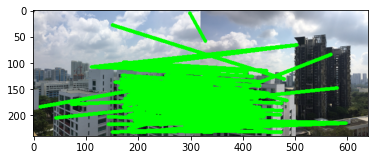

In [338]:
im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(matches1)):
    image = cv2.line(im_concat,coordinates_im1[i],coordinates_im2[i],(0, 255, 0),thickness=5)

plt.imshow(image)


In [339]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

Applying RANSAC to exract inliers from all matches:

In [340]:
import random 
#dist=[]
iterations=200
n=5
inliers_max=0
for t in range(0,iterations):
    rand_indices=[]
    points=[]
    coordinates_1=[]
    coordinates_2=[]
    for i in range(0,5):
        rand_index=random.sample(range(0, len(matches1)), 1)
        if rand_index not in rand_indices:
            rand_indices.append(rand_index)
            
    for k in rand_indices:
        coordinates_1.append(np.array(kp1[matches1[k[0]][0]].pt,dtype=int))
        coordinates_2.append(np.array(kp2[matches1[k[0]][1]].pt,dtype=int))
    coordinates_1_hm=[]
    coordinates_2_hm=[]
    A = []
    b = []
    for i in range(len(coordinates_1)):
        s_x, s_y = coordinates_1[i]
        coordinates_1_hm.append([s_x,s_y,1])
        d_x, d_y = coordinates_2[i]
        coordinates_2_hm.append([d_x,d_y,1])
        A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
        A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
        b += [d_x, d_y]
    A = np.array(A)
    #h = np.linalg.lstsq(A, b,rcond=-1)[0]
    #h = np.concatenate((h, [1]), axis=-1)

    import scipy.linalg as linalg
    A = np.array(A)
    U, Sigma, V_transpose = linalg.svd(A)

    H = np.reshape(V_transpose[-1], (3,3))
    coordinates_1_transform=np.dot(H,np.array(coordinates_im1_hm).T)
    dx=(np.array(coordinates_1_transform)[0]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[0]/np.array(coordinates_im2_hm).T[2])
    dy=(np.array(coordinates_1_transform)[1]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[1]/np.array(coordinates_im2_hm).T[2])
    inliers_f=np.array(dx**2+dy**2<3**2,dtype=int)
    #dist.append(dx**2+dy**2)
    inliers_num = np.sum(inliers_f)
    #if inliers_num==5:
        #print(dx**2+dy**2)
    print(inliers_num)
    if inliers_num > inliers_max:
        inliers_max = inliers_num
        inliers_indices=[index for index in range(len(inliers_f)) if inliers_f[index] ==1]
        for inlier_ind in inliers_indices:
            inliers_X1 = np.array(coordinates_im1_hm)[inliers_indices]
            inliers_X2 = np.array(coordinates_im2_hm)[inliers_indices]
            best_X1 = np.array(coordinates_1) # the X1 keypoints that matches best
            best_X2 = np.array(coordinates_2) # the X2 keypoints that matches best
            best_H12 = H;         # the transformation between best X1 and X2
    
    

1
18
70
1
0
8
2
2
2
2
12
2
0
0
0
3
0
3
0
3
4
2
1
0
1
1
4
10
2
0
0
0
1
6
0
70
2
3
19
0
5
2
0
3
6
2
5
1
13
3
0
3
1
1
3
5
1
71
0
0
0
0
0
2
0
66
71
4
2
4
51
1
1
58
0
1
6
2
2
0
0
8
1
2
1
3
46
2
8
2
2
1
5
1
70
3
3
2
0
10
2
7
0
4
2
71
6
3
68
0
1
70
8
2
4
15
0
1
0
1
0
36
4
33
0
0
3
2
0
3
8
0
0
1
0
0
1
1
1
0
0
1
2
4
1
5
2
8
2
1
2
3
0
7
1
44
4
3
4
6
0
10
70
6
4
3
2
4
1
5
2
1
10
1
1
3
0
9
22
0
10
11
2
0
2
20
3
2
0
4
1
4
2
4
33
69
8
21
1
1


In [16]:
dist

[[197030.0,
  198879.0,
  197091.0,
  282341.0,
  222283.0,
  153412.0,
  288037.0,
  298739.0,
  189400.0,
  287180.0,
  134814.0,
  258800.0,
  283751.0,
  246208.0,
  234301.0,
  272609.0,
  229110.0,
  296793.0,
  238414.0,
  94359.0,
  215599.0,
  285412.0,
  266161.0,
  336689.0,
  307706.0,
  318630.0,
  274764.0,
  358978.0,
  374184.0,
  256807.0,
  390641.0,
  336140.0,
  370038.0,
  369194.0,
  349953.0,
  266278.0,
  371199.0,
  329453.0,
  324977.0,
  347717.0,
  330770.0,
  316307.0,
  316523.0,
  327970.0,
  137488.0,
  195854.0,
  343612.0,
  323024.0,
  267970.0,
  333842.0,
  326489.0,
  328276.0,
  327605.0,
  328227.0,
  278956.0,
  337326.0,
  310378.0,
  238915.0,
  362373.0,
  326185.0,
  300151.0,
  308146.0,
  240026.0,
  349290.0,
  342138.0,
  280833.0,
  303484.0,
  290202.0,
  149375.0,
  295528.0,
  363863.0,
  299283.0,
  253285.0,
  270296.0,
  246159.0,
  318125.0,
  362861.0,
  255367.0,
  356891.0,
  281433.0,
  267566.0,
  323437.0,
  359086.0,
  285

In [42]:
len(inliers_X1)

114

In [310]:
coordinates_im1_inliers=[]
coordinates_im2_inliers=[]
for i in range(0,len(inliers_X1)):
    coordinates_im1_inliers.append([inliers_X1[i][0],inliers_X1[i][1]])
    coordinates_im2_inliers.append([inliers_X2[i][0]+im2.shape[1],inliers_X2[i][1]])

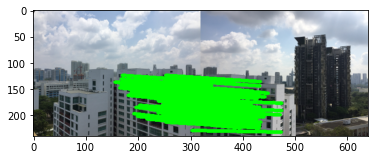

In [341]:
coordinates_im1_inliers=[]
coordinates_im2_inliers=[]
for i in range(0,len(inliers_X1)):
    coordinates_im1_inliers.append([inliers_X1[i][0],inliers_X1[i][1]])
    coordinates_im2_inliers.append([inliers_X2[i][0]+im2.shape[1],inliers_X2[i][1]])

im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(inliers_X1)):
     image = cv2.line(im_concat,coordinates_im1_inliers[i],coordinates_im2_inliers[i],(0, 255, 0),thickness=5)

plt.imshow(image)


In [440]:
len(inliers_X1)

103

In [ ]:
Interpolating images and appending scaled coordinates:

In [237]:
im2_interpolate=cv2.resize(im2,(4*im1.shape[1],4*im1.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)

In [343]:
inliers_X1_scaled=[]
inliers_X2_scaled=[]
for i in range(0,len(inliers_X1)):
    inliers_X1_scaled.append([18*inliers_X1[i][0],18*inliers_X1[i][1]])
    inliers_X2_scaled.append([4*inliers_X2[i][0],4*inliers_X2[i][1]])

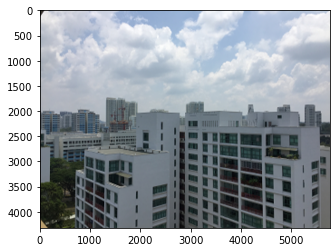

In [342]:
#im1=plt.imread('im01.jpg')

im1_interpolate=cv2.resize(im1,(18*im1.shape[1],18*im1.shape[0]),fx=16, fy=16, interpolation=cv2.INTER_CUBIC)
plt.imshow(im1_interpolate)

In [21]:
# A = []
# b = []
# for i in range(len(inliers_X1)):
#     s_x, s_y = inliers_X1_scaled[i][0:2]
#    # coordinates_1_hm.append([s_x,s_y,1])
#     d_x, d_y = inliers_X2[i][0:2]
#     #coordinates_2_hm.append([d_x,d_y,1])
#     A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
#     A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
#     b += [d_x, d_y]
# A = np.array(A)
# #h = np.linalg.lstsq(A, b,rcond=-1)[0]
# #h = np.concatenate((h, [1]), axis=-1)

# import scipy.linalg as linalg
# A = np.array(A)
# U, Sigma, V_transpose = linalg.svd(A)

# H = np.reshape(V_transpose[-1], (3,3))

Generating homography matrix using scaled inliers:

In [344]:
A = []
b = []
for i in range(len(inliers_X1)):
    s_x, s_y = inliers_X1_scaled[i][0:2]
   # coordinates_1_hm.append([s_x,s_y,1])
    d_x, d_y = inliers_X2_scaled[i][0:2]
    #coordinates_2_hm.append([d_x,d_y,1])
    A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
    A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
    b += [d_x, d_y]
A = np.array(A)
#h = np.linalg.lstsq(A, b,rcond=-1)[0]
#h = np.concatenate((h, [1]), axis=-1)

import scipy.linalg as linalg
A = np.array(A)
U, Sigma, V_transpose = linalg.svd(A)

H = np.reshape(V_transpose[-1], (3,3))

In [345]:
H12=H

In [29]:
H

array([[ 8.02134559e-04, -3.16764928e-05, -9.52246571e-01],
       [ 1.98182812e-04,  6.65990155e-04, -3.05325056e-01],
       [ 6.95639480e-07, -3.13480040e-08,  1.39663902e-03]])

In [479]:
H

array([[ 3.24579024e-03, -1.38128829e-04, -9.59160074e-01],
       [ 7.57053613e-04,  2.68324795e-03, -2.82827511e-01],
       [ 2.66597151e-06, -1.46999358e-07,  1.49128263e-03]])

In [23]:
#h1,w1=im1_interpolate.shape[0:2]

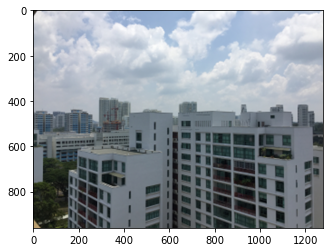

In [24]:
#plt.imshow(im1_interpolate)

Transforming border position coordinates of image 1 to determine canvas size:

In [26]:
h1,w1=im1_interpolate.shape[0:2]
vertex = np.array([[0, 0, 1], [0, h1, 1], [w1, 0, 1], [w1, h1, 1]]);
pos = np.dot(H ,vertex.T); #position of transformed vertices


In [28]:
row=(pos[1,:]/pos[2,:]).astype(int)
col=(pos[0,:]/pos[2,:]).astype(int)

In [29]:
col_min = min(col)
col_max = max(col)
row_min = min(row)
row_max = max(row)

In [30]:
if col_min>0:
    col_min=1
if row_min>0:
    row_min=1

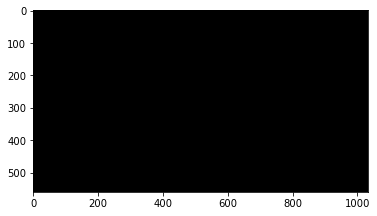

In [39]:
canvas1 = np.zeros([row_max-row_min+100, col_max-col_min+500, 3])
canvas1.shape
plt.imshow(canvas1)

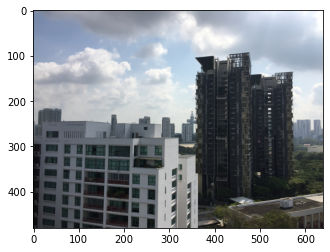

In [598]:
# im2=plt.imread('im02.jpg')
# plt.imshow(im2)

Placing interpolated image 2 on the canvas:

In [40]:
for y in range(0,im2_interpolate.shape[0]):
    
    for x in range(0,im2_interpolate.shape[1]):
        
        tx2 = x-col_min
        ty2 = y-row_min
        if ty2<canvas1.shape[0] and tx2<canvas1.shape[1]:
            canvas1[ty2,tx2] = im2_interpolate[y,x]
 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


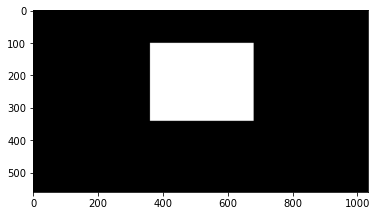

In [41]:
plt.imshow(canvas1)

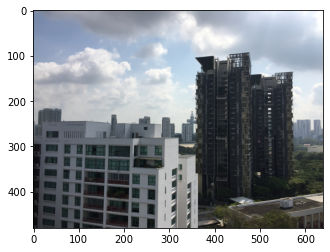

In [498]:
plt.imshow(im2/255)

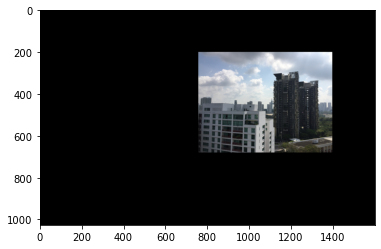

In [27]:
plt.imshow(canvas1/255)

In [477]:
h1

1920

Transforming image 1 coordinates using homography matrix and placing on canvas:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


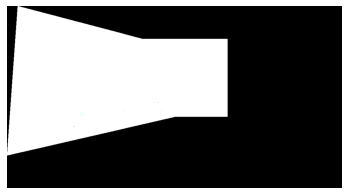

In [42]:
for y in range(0, h1):
    for x in range(0, w1):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H * np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        #if tx<canvas1.shape[0] and ty<canvas1.shape[1]:
        canvas1[ty,tx]=im1_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas1)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

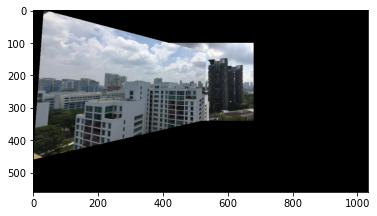

In [43]:
plt.imshow(canvas1/255)


# Stitching Image 2 and Image 3

In order to stitch image 2 to image 3, the sift keypoints and decriptors for each image is computed following which descriptors are used to compute all the matches between image 2 and image 3. The inliers are then extracted using RANSAC and are used to compute the homography matrix which is to be used to stitch image 2 to image .
Here image 2 is interpolated to a scale of 4 while scale of image 3 remains the same.

Reading image 2 and image 3 and computing their corresponding SIFT keypoints and descriptors:

In [243]:
im1=plt.imread('im02.jpg')
im1=cv2.resize(im1,(320,240))
img=im1.copy()

sift1 = cv2.SIFT_create()
#gray_im1= cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)

kp1, des1 = sift1.detectAndCompute(im1,None)
img=cv2.drawKeypoints(im1,kp1,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [244]:
im2=plt.imread('im03.jpg')
im2=cv2.resize(im2,(320,240))

img1=im2.copy()
sift2 = cv2.SIFT_create()
gray_im2= cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

kp2, des2 = sift2.detectAndCompute(im2,None)
img1=cv2.drawKeypoints(im2,kp2,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

Obtaining all matches for each descriptor of image 2 and 3.

In [245]:
threshold=1.5
matches=[]
scores=[]
dist=[]
for i in range(0,des1.shape[0]):
    #print(i)
    closest_distance=1e10
    second_closest_dist=1e10
    best_match=None
    dist_temp=[]
    for j in range(0,des2.shape[0]):
        
        
        
        d = des1[i,:] - des2[j,:]
        
        squared_dist = np.sum(d**2)
        dist_temp.append(squared_dist)
        #print(squared_dist)
        if squared_dist<closest_distance:
#             print(j)
#             print(closest_distance)
#             print(squared_dist)
            
            second_closest_dist=closest_distance
            closest_distance=squared_dist
            best_match=j
        elif squared_dist<second_closest_dist:
            second_closest_dist=squared_dist
    if (threshold * closest_distance < second_closest_dist) and (best_match != None):
        #print(i)
        #print(j)
        matches.append([i,best_match])
        scores.append(closest_distance)
    dist.append(dist_temp)

In [246]:
ind=np.argsort(np.array(scores))
matches1=[]
matches_img1=[]
matches_img2=[]
for i in ind:
    matches1.append(matches[i])
    matches_img1.append(matches[i][0])
    matches_img2.append(matches[i][1])

In [247]:
matches1

[[400, 172],
 [413, 189],
 [399, 168],
 [398, 171],
 [516, 295],
 [467, 253],
 [415, 190],
 [375, 142],
 [490, 274],
 [325, 91],
 [401, 169],
 [430, 214],
 [244, 14],
 [423, 201],
 [492, 276],
 [357, 130],
 [479, 264],
 [505, 287],
 [464, 248],
 [431, 216],
 [443, 228],
 [374, 141],
 [261, 31],
 [323, 89],
 [372, 143],
 [468, 254],
 [441, 227],
 [472, 255],
 [480, 265],
 [456, 241],
 [466, 252],
 [403, 178],
 [427, 218],
 [473, 258],
 [500, 284],
 [363, 134],
 [386, 153],
 [341, 110],
 [520, 300],
 [342, 108],
 [519, 298],
 [338, 107],
 [302, 64],
 [447, 233],
 [303, 65],
 [295, 61],
 [518, 302],
 [324, 82],
 [428, 208],
 [293, 66],
 [368, 140],
 [370, 140],
 [344, 93],
 [453, 238],
 [440, 229],
 [279, 44],
 [465, 251],
 [512, 296],
 [496, 279],
 [487, 270],
 [404, 174],
 [497, 281],
 [391, 160],
 [339, 105],
 [498, 283],
 [460, 245],
 [265, 41],
 [354, 128],
 [308, 68],
 [463, 250],
 [350, 125],
 [469, 249],
 [349, 123],
 [306, 62],
 [343, 111],
 [434, 223],
 [504, 286],
 [315, 80],
 

In [248]:
coordinates_im1=[]
coordinates_im2=[]
for i in range(0,len(matches1)):
    coordinates_im1.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1])])
    coordinates_im2.append([int(kp2[matches1[i][1]].pt[0]+im2.shape[1]),int(kp2[matches1[i][1]].pt[1])])

In [249]:
im2.shape

(240, 320, 3)

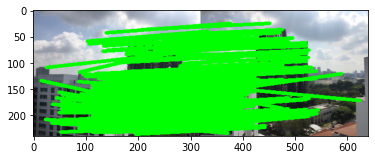

In [250]:
im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(matches1)):
    image = cv2.line(im_concat,coordinates_im1[i],coordinates_im2[i],(0, 255, 0),thickness=5)

plt.imshow(image)

In [61]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

Extracting inliers through RANSAC:

In [251]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

import random 

iterations=200
n=5
inliers_max=0
for t in range(0,iterations):
    rand_indices=[]
    points=[]
    coordinates_1=[]
    coordinates_2=[]
    for i in range(0,5):
        rand_index=random.sample(range(0, len(matches1)), 1)
        if rand_index not in rand_indices:
            rand_indices.append(rand_index)
            
    for k in rand_indices:
        coordinates_1.append(np.array(kp1[matches1[k[0]][0]].pt,dtype=int))
        coordinates_2.append(np.array(kp2[matches1[k[0]][1]].pt,dtype=int))
    coordinates_1_hm=[]
    coordinates_2_hm=[]
    A = []
    b = []
    for i in range(len(coordinates_1)):
        s_x, s_y = coordinates_1[i]
        coordinates_1_hm.append([s_x,s_y,1])
        d_x, d_y = coordinates_2[i]
        coordinates_2_hm.append([d_x,d_y,1])
        A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
        A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
        b += [d_x, d_y]
    A = np.array(A)
    #h = np.linalg.lstsq(A, b,rcond=-1)[0]
    #h = np.concatenate((h, [1]), axis=-1)

    import scipy.linalg as linalg
    A = np.array(A)
    U, Sigma, V_transpose = linalg.svd(A)

    H = np.reshape(V_transpose[-1], (3,3))
    coordinates_1_transform=np.dot(H,np.array(coordinates_im1_hm).T)
    dx=(np.array(coordinates_1_transform)[0]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[0]/np.array(coordinates_im2_hm).T[2])
    dy=(np.array(coordinates_1_transform)[1]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[1]/np.array(coordinates_im2_hm).T[2])
    inliers_f=np.array(dx**2+dy**2<3**2,dtype=int)
    inliers_num = np.sum(inliers_f)
    #if inliers_num==5:
        #print(dx**2+dy**2)
    print(inliers_num)
    if inliers_num > inliers_max:
        inliers_max = inliers_num
        inliers_indices=[index for index in range(len(inliers_f)) if inliers_f[index] ==1]
        for inlier_ind in inliers_indices:
            inliers_X1 = np.array(coordinates_im1_hm)[inliers_indices]
            inliers_X2 = np.array(coordinates_im2_hm)[inliers_indices]
            best_X1 = np.array(coordinates_1) # the X1 keypoints that matches best
            best_X2 = np.array(coordinates_2) # the X2 keypoints that matches best
            best_H12 = H;         # the transformation between best X1 and X2
    
    

2
133
4
120
102
0
0
0
96
10
1
10
3
38
162
1
2
0
4
17
2
3
10
0
158
0
15
128
3
5
5
83
1
3
2
83
7
26
2
159
3
0
1
129
134
0
4
4
0
8
1
14
43
1
0
0
3
2
157
150
2
3
144
136
0
12
2
5
3
132
67
1
4
142
8
128
82
158
102
0
0
1
0
86
116
2
0
8
18
2
0
151
0
105
0
2
122
9
1
27
1
2
119
3
134
0
160
3
1
157
8
3
1
1
8
42
25
13
94
73
127
0
0
2
1
160
0
2
1
160
107
0
1
158
22
79
1
2
0
6
5
3
59
5
23
0
98
0
1
160
130
59
1
14
78
145
149
10
6
157
1
7
149
159
0
102
1
1
5
2
156
2
0
0
4
2
6
64
2
54
2
8
10
0
1
142
2
43
161
88
1
4
99
151
116
4
41
1
136
2


In [57]:
len(inliers_X1)

362

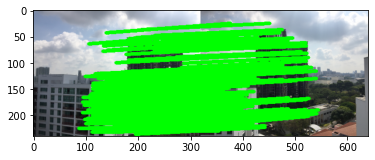

In [252]:
coordinates_im1_inliers=[]
coordinates_im2_inliers=[]
for i in range(0,len(inliers_X1)):
    coordinates_im1_inliers.append([inliers_X1[i][0],inliers_X1[i][1]])
    coordinates_im2_inliers.append([inliers_X2[i][0]+im2.shape[1],inliers_X2[i][1]])

im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(inliers_X1)):
     image = cv2.line(im_concat,coordinates_im1_inliers[i],coordinates_im2_inliers[i],(0, 255, 0),thickness=5)

plt.imshow(image)


Interpolating image 2 and appending scaled inlier coordinates for computation of homography matrix:
    Here image 2 is scaled to a size of 4 while size of image 3 remains the same.

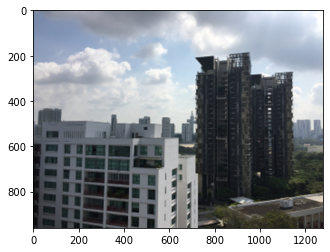

In [253]:
im1_interpolate=cv2.resize(im1,(4*im2.shape[1],4*im2.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
plt.imshow(im1_interpolate)

In [254]:
inliers_X1_scaled=[]
inliers_X2_scaled=[]
for i in range(0,len(inliers_X1)):
    inliers_X1_scaled.append([4*inliers_X1[i][0],4*inliers_X1[i][1]])
    inliers_X2_scaled.append([4*inliers_X2[i][0],4*inliers_X2[i][1]])

Computing Homography Matrix:

In [255]:
A = []
b = []
for i in range(len(inliers_X1)):
    s_x, s_y = inliers_X1_scaled[i][0:2]
   # coordinates_1_hm.append([s_x,s_y,1])
    d_x, d_y = inliers_X2[i][0:2]
    #coordinates_2_hm.append([d_x,d_y,1])
    A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
    A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
    b += [d_x, d_y]
A = np.array(A)
#h = np.linalg.lstsq(A, b,rcond=-1)[0]
#h = np.concatenate((h, [1]), axis=-1)

import scipy.linalg as linalg
A = np.array(A)
U, Sigma, V_transpose = linalg.svd(A)

H = np.reshape(V_transpose[-1], (3,3))

In [256]:
H23=H

In [97]:
im1.shape

(480, 640, 3)

In [68]:
h1,w1=im1_interpolate.shape[0:2]
vertex = np.array([[0, 0, 1], [0, h1, 1], [w1, 0, 1], [w1, h1, 1]]);
pos = np.dot(H ,vertex.T); #position of transformed vertices

row=(pos[1,:]/pos[2,:]).astype(int)

col=(pos[0,:]/pos[2,:]).astype(int)

col_min = min(col)
col_max = max(col)
row_min = min(row)
row_max = max(row)

In [64]:
col_min

-268

In [65]:
col_min
row_min

-95

In [69]:
if col_min>1:
    col_min=1
if row_min>1:
    row_min=1

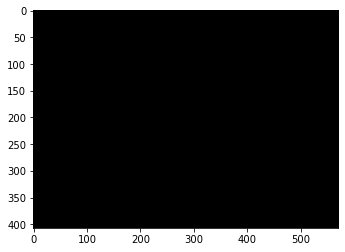

In [70]:
canvas3 = np.zeros([row_max-row_min+100,col_max-col_min+200, 3])
canvas3.shape
plt.imshow(canvas3)

In [71]:
for y in range(0,im2.shape[0]):
    
    for x in range(0,im2.shape[1]):
        
        tx2 = x - col_min
        ty2 = y -row_min
        #if ty2<canvas3.shape[0] and tx2<canvas3.shape[1]:
        canvas3[ty2,tx2] = im2[y,x]

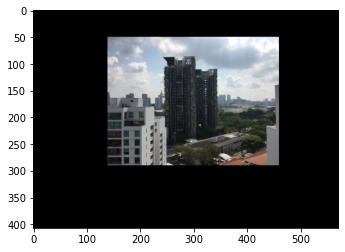

In [72]:
plt.imshow(canvas3/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


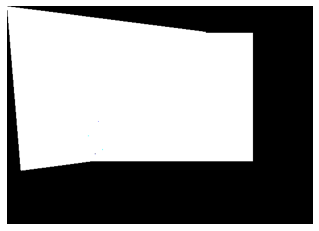

In [73]:
for y in range(0, h1):
    for x in range(0, w1):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        #if tx<canvas3.shape[0] and ty<canvas3.shape[1]:
        canvas3[ty,tx]=im1_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas3)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

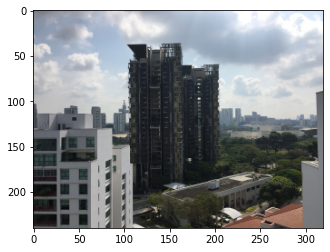

In [76]:
plt.imshow(im2)

Displaying the stitched images:

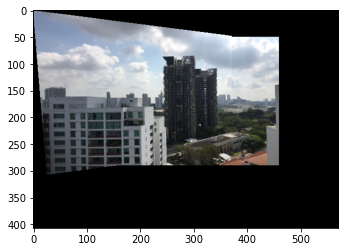

In [74]:
plt.imshow(canvas3/255)

# Stitching Image 3 and Image 4

In order to stitch image 3 to image 4, the sift keypoints and decriptors for each image is computed following which descriptors are used to compute all the matches between image 2 and image 3. The inliers are then extracted using RANSAC and are used to compute the homography matrix which is to be used to stitch image 2 to image .
Here image 4 is interpolated to a scale of 2 while scale of image 3 remains the same.

Reading images 3 and 4 and computing their corresponding SIFT Keypoints and Descriptors respectively:

In [72]:
im1=plt.imread('im03.jpg')
im1=cv2.resize(im1,(320,240))
img=im1.copy()

sift1 = cv2.SIFT_create()
#gray_im1= cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)

kp1, des1 = sift1.detectAndCompute(im1,None)
img=cv2.drawKeypoints(im1,kp1,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [77]:
im2=plt.imread('im04.jpg')
im2=cv2.resize(im2,(320,240))

img1=im2.copy()
sift2 = cv2.SIFT_create()
gray_im2= cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

kp2, des2 = sift2.detectAndCompute(im2,None)
img1=cv2.drawKeypoints(im2,kp2,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

Obtaining match for each descriptor in image 3 and 4:

In [78]:
threshold=1.5
matches=[]
scores=[]
dist=[]
for i in range(0,des1.shape[0]):
    #print(i)
    closest_distance=1e10
    second_closest_dist=1e10
    best_match=None
    dist_temp=[]
    for j in range(0,des2.shape[0]):
        
        
        
        d = des1[i,:] - des2[j,:]
        
        squared_dist = np.sum(d**2)
        dist_temp.append(squared_dist)
        #print(squared_dist)
        if squared_dist<closest_distance:
#             print(j)
#             print(closest_distance)
#             print(squared_dist)
            
            second_closest_dist=closest_distance
            closest_distance=squared_dist
            best_match=j
        elif squared_dist<second_closest_dist:
            second_closest_dist=squared_dist
    if (threshold * closest_distance < second_closest_dist) and (best_match != None):
        #print(i)
        #print(j)
        matches.append([i,best_match])
        scores.append(closest_distance)
    dist.append(dist_temp)

In [79]:
ind=np.argsort(np.array(scores))
matches1=[]
matches_img1=[]
matches_img2=[]
for i in ind:
    matches1.append(matches[i])
    matches_img1.append(matches[i][0])
    matches_img2.append(matches[i][1])

In [80]:
matches1

[[479, 134],
 [473, 129],
 [399, 54],
 [400, 56],
 [505, 151],
 [432, 91],
 [427, 90],
 [496, 145],
 [492, 143],
 [490, 140],
 [531, 172],
 [477, 130],
 [426, 89],
 [428, 81],
 [401, 57],
 [463, 123],
 [500, 148],
 [373, 25],
 [466, 126],
 [443, 99],
 [375, 27],
 [508, 157],
 [431, 88],
 [511, 160],
 [371, 23],
 [445, 104],
 [422, 76],
 [398, 56],
 [501, 151],
 [465, 124],
 [472, 127],
 [467, 125],
 [386, 34],
 [518, 167],
 [497, 149],
 [499, 153],
 [405, 63],
 [502, 150],
 [403, 60],
 [469, 122],
 [411, 160],
 [447, 109],
 [521, 165],
 [442, 98],
 [437, 95],
 [417, 285],
 [388, 40],
 [347, 2],
 [424, 77],
 [516, 161],
 [504, 147],
 [520, 163],
 [367, 22],
 [451, 111],
 [487, 138],
 [396, 46],
 [453, 113],
 [446, 105],
 [495, 91],
 [433, 92],
 [369, 23],
 [519, 162],
 [478, 133],
 [522, 166],
 [461, 119],
 [430, 85],
 [509, 158],
 [456, 118],
 [425, 78],
 [444, 103],
 [486, 99],
 [354, 14],
 [389, 39],
 [491, 142],
 [357, 15],
 [481, 134],
 [407, 65],
 [498, 152],
 [365, 20],
 [429, 83

In [81]:
coordinates_im1=[]
coordinates_im2=[]
for i in range(0,len(matches1)):
    coordinates_im1.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1])])
    coordinates_im2.append([int(kp2[matches1[i][1]].pt[0]+im2.shape[1]),int(kp2[matches1[i][1]].pt[1])])

In [82]:
im2.shape

(240, 320, 3)

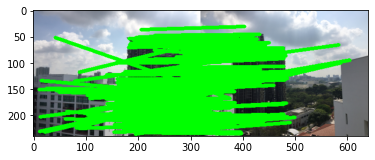

In [83]:
im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(matches1)):
    image = cv2.line(im_concat,coordinates_im1[i],coordinates_im2[i],(0, 255, 0),thickness=5)

plt.imshow(image)

In [84]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

Applying RANSAC to obtain the inliers:

In [85]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

import random 

iterations=200
n=5
inliers_max=0
for t in range(0,iterations):
    rand_indices=[]
    points=[]
    coordinates_1=[]
    coordinates_2=[]
    for i in range(0,5):
        rand_index=random.sample(range(0, len(matches1)), 1)
        if rand_index not in rand_indices:
            rand_indices.append(rand_index)
            
    for k in rand_indices:
        coordinates_1.append(np.array(kp1[matches1[k[0]][0]].pt,dtype=int))
        coordinates_2.append(np.array(kp2[matches1[k[0]][1]].pt,dtype=int))
    coordinates_1_hm=[]
    coordinates_2_hm=[]
    A = []
    b = []
    for i in range(len(coordinates_1)):
        s_x, s_y = coordinates_1[i]
        coordinates_1_hm.append([s_x,s_y,1])
        d_x, d_y = coordinates_2[i]
        coordinates_2_hm.append([d_x,d_y,1])
        A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
        A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
        b += [d_x, d_y]
    A = np.array(A)
    #h = np.linalg.lstsq(A, b,rcond=-1)[0]
    #h = np.concatenate((h, [1]), axis=-1)

    import scipy.linalg as linalg
    A = np.array(A)
    U, Sigma, V_transpose = linalg.svd(A)

    H = np.reshape(V_transpose[-1], (3,3))
    coordinates_1_transform=np.dot(H,np.array(coordinates_im1_hm).T)
    dx=(np.array(coordinates_1_transform)[0]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[0]/np.array(coordinates_im2_hm).T[2])
    dy=(np.array(coordinates_1_transform)[1]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[1]/np.array(coordinates_im2_hm).T[2])
    inliers_f=np.array(dx**2+dy**2<3**2,dtype=int)
    inliers_num = np.sum(inliers_f)
    #if inliers_num==5:
        #print(dx**2+dy**2)
    print(inliers_num)
    if inliers_num > inliers_max:
        inliers_max = inliers_num
        inliers_indices=[index for index in range(len(inliers_f)) if inliers_f[index] ==1]
        for inlier_ind in inliers_indices:
            inliers_X1 = np.array(coordinates_im1_hm)[inliers_indices]
            inliers_X2 = np.array(coordinates_im2_hm)[inliers_indices]
            best_X1 = np.array(coordinates_1) # the X1 keypoints that matches best
            best_X2 = np.array(coordinates_2) # the X2 keypoints that matches best
            best_H12 = H;         # the transformation between best X1 and X2
    
    

1
0
3
44
0
1
53
3
7
25
6
0
27
6
4
0
81
6
34
5
1
7
3
1
71
0
0
1
3
0
13
1
57
2
4
71
13
0
59
1
2
25
5
6
0
10
6
41
0
0
6
2
1
67
78
3
1
1
0
8
70
77
30
8
79
4
28
1
0
1
5
0
83
6
5
10
6
1
6
1
0
14
6
1
4
0
3
0
8
1
0
10
1
4
1
6
2
1
0
2
3
79
0
0
0
3
0
2
2
11
75
10
1
0
0
2
0
3
1
0
14
83
1
0
17
2
7
1
3
78
37
2
14
0
1
50
4
1
47
29
5
75
4
20
3
0
1
7
68
9
5
0
0
4
27
0
0
0
0
7
25
0
0
3
41
6
38
63
2
34
48
74
4
0
3
5
1
2
5
2
4
46
1
6
31
0
2
2
0
2
2
1
0
3
2
4
8
0
43
2


In [286]:
len(inliers_X1)

363

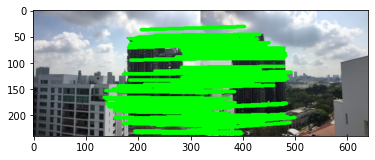

In [86]:
coordinates_im1_inliers=[]
coordinates_im2_inliers=[]
for i in range(0,len(inliers_X1)):
    coordinates_im1_inliers.append([inliers_X1[i][0],inliers_X1[i][1]])
    coordinates_im2_inliers.append([inliers_X2[i][0]+im2.shape[1],inliers_X2[i][1]])

im_concat = cv2.hconcat([im1, im2])
image=im_concat.copy()
for i in range(0,len(inliers_X1)):
     image = cv2.line(im_concat,coordinates_im1_inliers[i],coordinates_im2_inliers[i],(0, 255, 0),thickness=5)

plt.imshow(image)


Interpolating image 4 by scale 2 and appending the corresponding scaled inlier coordinates:

In [102]:
inliers_X1_scaled=[]
inliers_X2_scaled=[]
for i in range(0,len(inliers_X1)):
    inliers_X1_scaled.append([2*inliers_X1[i][0],2*inliers_X1[i][1]])
    inliers_X2_scaled.append([2*inliers_X2[i][0],2*inliers_X2[i][1]])

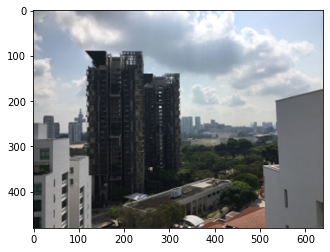

In [101]:
im2_interpolate=cv2.resize(im2,(2*im2.shape[1],2*im2.shape[0]),fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
plt.imshow(im2_interpolate)

Computing homography matrix using original inliers obtained for image 2 and scaled inlier coordinates obtained for image 4:

In [103]:
A = []
b = []
for i in range(len(inliers_X1)):
    s_x, s_y = inliers_X1[i][0:2]
   # coordinates_1_hm.append([s_x,s_y,1])
    d_x, d_y = inliers_X2_scaled[i][0:2]
    #coordinates_2_hm.append([d_x,d_y,1])
    A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
    A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
    b += [d_x, d_y]
A = np.array(A)
#h = np.linalg.lstsq(A, b,rcond=-1)[0]
#h = np.concatenate((h, [1]), axis=-1)

import scipy.linalg as linalg
A = np.array(A)
U, Sigma, V_transpose = linalg.svd(A)

H = np.reshape(V_transpose[-1], (3,3))
H_inv=linalg.inv(H)

In [104]:
H34=H

Defining canvas to stitch images 3 and 4:

In [105]:
h1,w1=im1.shape[0:2]
vertex = np.array([[0, 0, 1], [0, h1, 1], [w1, 0, 1], [w1, h1, 1]]);
pos = np.dot(H ,vertex.T); #position of transformed vertices

row=(pos[1,:]/pos[2,:]).astype(int)

col=(pos[0,:]/pos[2,:]).astype(int)

col_min = min(col)
col_max = max(col)
row_min = min(row)
row_max = max(row)

In [106]:
if col_min>1:
    col_min=1
if row_min>1:
    row_min=1

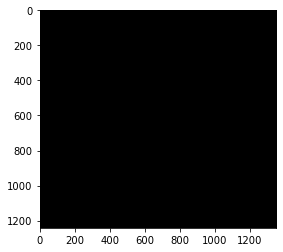

In [111]:
canvas3 = np.zeros([row_max-row_min+500,col_max-col_min+500, 3])
canvas3.shape
plt.imshow(canvas3)

Placing image 4 onto the canvas:

In [112]:
for y in range(0,im2_interpolate.shape[0]):
    
    for x in range(0,im2_interpolate.shape[1]):
        
        tx2 = x - col_min
        ty2 = y -row_min
        #if ty2<canvas3.shape[0] and tx2<canvas3.shape[1]:
        canvas3[ty2,tx2] = im2_interpolate[y,x]

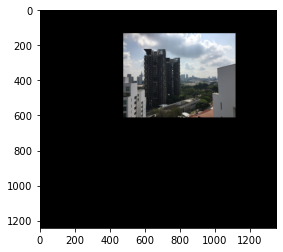

In [113]:
plt.imshow(canvas3/255)

Transforming image 3 coordinates using homography matrix and placing onto canvas:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


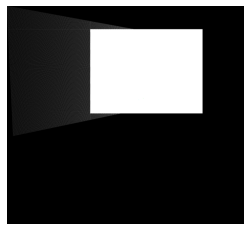

In [114]:
for y in range(0, h1):
    for x in range(0, w1):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        #if tx<canvas3.shape[0] and ty<canvas3.shape[1]:
        canvas3[ty,tx]=im1[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas3)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

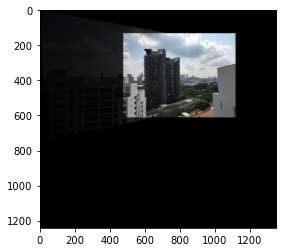

In [115]:
plt.imshow(canvas3/255)

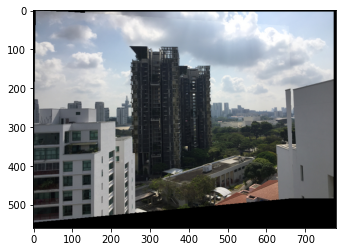

In [102]:
im4=cv2.normalize(canvas3[0:560,0:780]/255, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
#im4=cv2.resize(im4,(640,480))
#im3.shape
plt.imshow(im4)

# Stitching Image 4 and Image 5:

In order to stitch image 3 to image 4, the sift keypoints and decriptors for each image is computed following which descriptors are used to compute all the matches between image 2 and image 3. The inliers are then extracted using RANSAC and are used to compute the homography matrix which is to be used to stitch image 2 to image .
Here image 4 is interpolated to a scale of 2 while scale of image 3 remains the same.

Reading image 4 and 5 and computing their corresponding SIFT keypoints and descriptors respectively:

In [23]:
im1=plt.imread('im04.jpg')
im1=cv2.resize(im1,(320,240))
# im1=im4.copy()
img=im1.copy()

sift1 = cv2.SIFT_create()
#gray_im1= cv2.cvtColor(im1,cv2.COLOR_BGR2GRAY)

kp1, des1 = sift1.detectAndCompute(im1,None)
img=cv2.drawKeypoints(im1,kp1,img,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

In [24]:
im2=plt.imread('im05.jpg')
im2=cv2.resize(im2,(240,320))
#im2=im3.copy()
# im2=im2[0:450,0:600]
#im2=cv2.resize(im2,(640,480))
img1=im2.copy()
sift2 = cv2.SIFT_create()
gray_im2= cv2.cvtColor(im2,cv2.COLOR_BGR2GRAY)

kp2, des2 = sift2.detectAndCompute(im2,None)
img1=cv2.drawKeypoints(im2,kp2,img1,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

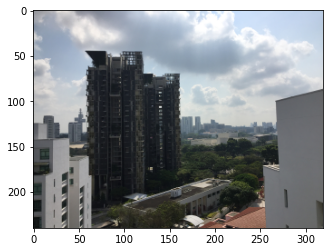

In [25]:
plt.imshow(im1)

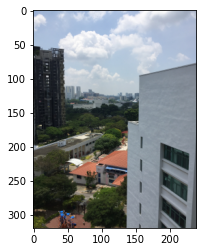

In [26]:
plt.imshow(im2)

In [27]:
im2.shape

(320, 240, 3)

Obtaining matching descriptor for every descriptor in image 4 and image 5:

In [28]:
threshold=1.5
matches=[]
scores=[]
dist=[]
for i in range(0,des1.shape[0]):
    #print(i)
    closest_distance=1e10
    second_closest_dist=1e10
    best_match=None
    dist_temp=[]
    for j in range(0,des2.shape[0]):
        
        
        
        d = des1[i,:] - des2[j,:]
        
        squared_dist = np.sum(d**2)
        dist_temp.append(squared_dist)
        #print(squared_dist)
        if squared_dist<closest_distance:
#             print(j)
#             print(closest_distance)
#             print(squared_dist)
            
            second_closest_dist=closest_distance
            closest_distance=squared_dist
            best_match=j
        elif squared_dist<second_closest_dist:
            second_closest_dist=squared_dist
    if (threshold * closest_distance < second_closest_dist) and (best_match != None):
        #print(i)
        #print(j)
        matches.append([i,best_match])
        scores.append(closest_distance)
    dist.append(dist_temp)

In [29]:
ind=np.argsort(np.array(scores))
matches1=[]
matches_img1=[]
matches_img2=[]
for i in ind:
    matches1.append(matches[i])
    matches_img1.append(matches[i][0])
    matches_img2.append(matches[i][1])

In [30]:
matches1

[[151, 60],
 [196, 184],
 [169, 97],
 [198, 186],
 [183, 147],
 [247, 292],
 [197, 185],
 [176, 133],
 [200, 188],
 [204, 200],
 [167, 82],
 [76, 112],
 [207, 202],
 [172, 107],
 [237, 275],
 [164, 78],
 [245, 288],
 [215, 221],
 [170, 99],
 [185, 167],
 [230, 262],
 [285, 397],
 [187, 166],
 [161, 68],
 [147, 59],
 [150, 61],
 [279, 342],
 [208, 216],
 [190, 174],
 [223, 60],
 [162, 70],
 [178, 149],
 [206, 201],
 [240, 281],
 [158, 65],
 [92, 313],
 [191, 177],
 [220, 235],
 [181, 148],
 [272, 324],
 [42, 321],
 [118, 84],
 [166, 83],
 [131, 8],
 [99, 7],
 [281, 129],
 [110, 181],
 [278, 47],
 [78, 396],
 [211, 219],
 [141, 40],
 [174, 106],
 [201, 189],
 [37, 107],
 [221, 270],
 [269, 255],
 [205, 203],
 [13, 86],
 [243, 286],
 [77, 395],
 [49, 359],
 [186, 165],
 [236, 282],
 [105, 79],
 [132, 86],
 [51, 178],
 [16, 86]]

In [31]:
coordinates_im1=[]
coordinates_im2=[]
for i in range(0,len(matches1)):
    coordinates_im1.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1])])
    coordinates_im2.append([int(kp2[matches1[i][1]].pt[0]+im2.shape[1]),int(kp2[matches1[i][1]].pt[1])])

In [32]:
im2.shape

(320, 240, 3)

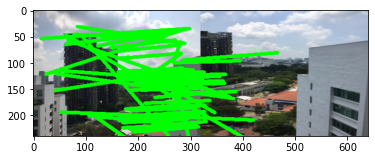

In [33]:
im_concat = cv2.hconcat([im1, cv2.resize(im2,(320,240))])
image=im_concat.copy()
for i in range(0,len(matches1)):
    image = cv2.line(im_concat,coordinates_im1[i],coordinates_im2[i],(0, 255, 0),thickness=5)

plt.imshow(image)

In [177]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

Obtaining inliers using RANSAC:

In [39]:
coordinates_im1_hm=[]
coordinates_im2_hm=[]
for i in range(0,len(matches1)):
    coordinates_im1_hm.append([int(kp1[matches1[i][0]].pt[0]),int(kp1[matches1[i][0]].pt[1]),1])
    coordinates_im2_hm.append([int(kp2[matches1[i][1]].pt[0]),int(kp2[matches1[i][1]].pt[1]),1])

import random 

iterations=200
n=5
inliers_max=0
for t in range(0,iterations):
    rand_indices=[]
    points=[]
    coordinates_1=[]
    coordinates_2=[]
    for i in range(0,5):
        rand_index=random.sample(range(0, len(matches1)), 1)
        if rand_index not in rand_indices:
            rand_indices.append(rand_index)
            
    for k in rand_indices:
        coordinates_1.append(np.array(kp1[matches1[k[0]][0]].pt,dtype=int))
        coordinates_2.append(np.array(kp2[matches1[k[0]][1]].pt,dtype=int))
    coordinates_1_hm=[]
    coordinates_2_hm=[]
    A = []
    b = []
    for i in range(len(coordinates_1)):
        s_x, s_y = coordinates_1[i]
        coordinates_1_hm.append([s_x,s_y,1])
        d_x, d_y = coordinates_2[i]
        coordinates_2_hm.append([d_x,d_y,1])
        A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
        A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
        b += [d_x, d_y]
    A = np.array(A)
    #h = np.linalg.lstsq(A, b,rcond=-1)[0]
    #h = np.concatenate((h, [1]), axis=-1)

    import scipy.linalg as linalg
    A = np.array(A)
    U, Sigma, V_transpose = linalg.svd(A)

    H = np.reshape(V_transpose[-1], (3,3))
    coordinates_1_transform=np.dot(H,np.array(coordinates_im1_hm).T)
    dx=(np.array(coordinates_1_transform)[0]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[0]/np.array(coordinates_im2_hm).T[2])
    dy=(np.array(coordinates_1_transform)[1]/np.array(coordinates_1_transform)[2])-(np.array(coordinates_im2_hm).T[1]/np.array(coordinates_im2_hm).T[2])
    inliers_f=np.array(dx**2+dy**2<3**2,dtype=int)
    inliers_num = np.sum(inliers_f)
    #if inliers_num==5:
        #print(dx**2+dy**2)
    print(inliers_num)
    if inliers_num > inliers_max:
        inliers_max = inliers_num
        inliers_indices=[index for index in range(len(inliers_f)) if inliers_f[index] ==1]
        for inlier_ind in inliers_indices:
            inliers_X1 = np.array(coordinates_im1_hm)[inliers_indices]
            inliers_X2 = np.array(coordinates_im2_hm)[inliers_indices]
            best_X1 = np.array(coordinates_1) # the X1 keypoints that matches best
            best_X2 = np.array(coordinates_2) # the X2 keypoints that matches best
            best_H12 = H;         # the transformation between best X1 and X2
    
    

0
0
2
4
2
0
5
0
1
0
2
30
0
0
0
2
1
1
40
0
0
35
3
25
7
3
2
4
7
5
6
8
0
2
1
38
0
4
7
1
8
23
1
1
0
2
1
0
1
0
5
4
39
2
0
1
4
1
1
41
1
2
0
0
5
1
1
2
38
3
0
17
8
14
4
3
10
6
0
1
6
0
40
4
0
11
1
7
2
1
3
1
7
1
4
27
2
2
3
0
6
10
2
3
1
7
7
4
4
5
13
1
9
3
3
0
6
33
1
40
2
0
7
20
1
14
5
5
6
38
5
20
1
1
1
2
0
1
4
25
2
2
0
22
6
4
6
2
0
0
3
10
5
5
2
6
0
2
0
0
0
1
1
5
5
1
0
5
4
2
3
1
2
0
2
3
3
0
0
40
3
2
2
1
8
1
3
2
2
22
4
5
1
12
13
0
4
1
1
1


In [40]:
len(inliers_X1)

41

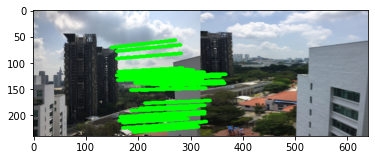

In [41]:
coordinates_im1_inliers=[]
coordinates_im2_inliers=[]
for i in range(0,len(inliers_X1)):
    coordinates_im1_inliers.append([inliers_X1[i][0],inliers_X1[i][1]])
    coordinates_im2_inliers.append([inliers_X2[i][0]+im2.shape[1],inliers_X2[i][1]])

im_concat = cv2.hconcat([im1, cv2.resize(im2,(320,240))])
image=im_concat.copy()
for i in range(0,len(inliers_X1)):
     image = cv2.line(im_concat,coordinates_im1_inliers[i],coordinates_im2_inliers[i],(0, 255, 0),thickness=5)

plt.imshow(image)


Interpolating and scaling image 4 by factor of 2 and image 5 by factor of 5 and appending their scaled inlier coordinates accordingly:

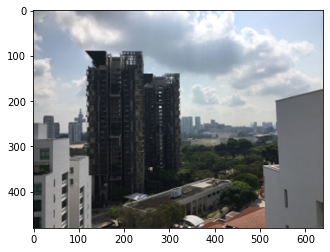

In [42]:
im1_interpolate=cv2.resize(im1,(2*im1.shape[1],2*im1.shape[0]),fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
plt.imshow(im1_interpolate)

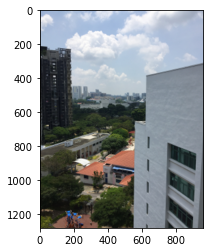

In [43]:
im2_interpolate=cv2.resize(im2,(4*im2.shape[1],4*im2.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
plt.imshow(im2_interpolate)

In [45]:
inliers_X1_scaled=[]
inliers_X2_scaled=[]
for i in range(0,len(inliers_X1)):
    inliers_X1_scaled.append([2*inliers_X1[i][0],2*inliers_X1[i][1]])
    inliers_X2_scaled.append([4*inliers_X2[i][0],4*inliers_X2[i][1]])

Computing the homography matrix:

In [47]:
A = []
b = []
for i in range(len(inliers_X1)):
    s_x, s_y = inliers_X1_scaled[i][0:2]
   # coordinates_1_hm.append([s_x,s_y,1])
    d_x, d_y = inliers_X2_scaled[i][0:2]
    #coordinates_2_hm.append([d_x,d_y,1])
    A.append([s_x, s_y, 1, 0, 0, 0, -(d_x)*(s_x), -(d_x)*(s_y),-d_x])
    A.append([0, 0, 0, s_x, s_y, 1, -(d_y)*(s_x), -(d_y)*(s_y),-d_y])
    b += [d_x, d_y]
A = np.array(A)
#h = np.linalg.lstsq(A, b,rcond=-1)[0]
#h = np.concatenate((h, [1]), axis=-1)

import scipy.linalg as linalg
A = np.array(A)
U, Sigma, V_transpose = linalg.svd(A)

H = np.reshape(V_transpose[-1], (3,3))
H_inv=linalg.inv(H)

Defining the canvas size through transformation of border coordinates of image 4:

In [50]:
h1,w1=im1_interpolate.shape[0:2]
vertex = np.array([[0, 0, 1], [0, h1, 1], [w1, 0, 1], [w1, h1, 1]]);
pos = np.dot(H ,vertex.T); #position of transformed vertices

row=(pos[1,:]/pos[2,:]).astype(int)

col=(pos[0,:]/pos[2,:]).astype(int)

col_min = min(col)
col_max = max(col)
row_min = min(row)
row_max = max(row)

In [49]:
H45=H

In [51]:
if col_min>1:
    col_min=1
if row_min>1:
    row_min=1

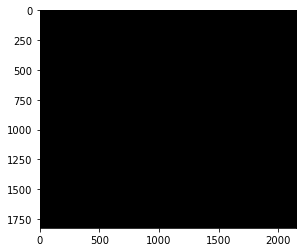

In [52]:
canvas3 = np.zeros([row_max-row_min+500, col_max-col_min+500, 3])
canvas3.shape
plt.imshow(canvas3/255)

Placing image 5 onto the canvas:

In [53]:
for y in range(0,im2_interpolate.shape[0]):
    
    for x in range(0,im2_interpolate.shape[1]):
        
        tx2 = x - col_min
        ty2 = y -row_min
        if ty2<canvas3.shape[0] and tx2<canvas3.shape[1]:
            canvas3[ty2,tx2] = im2_interpolate[y,x]

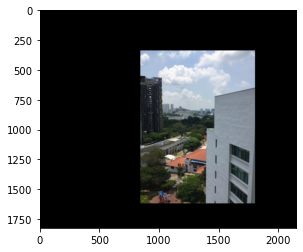

In [54]:
plt.imshow(canvas3/255)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


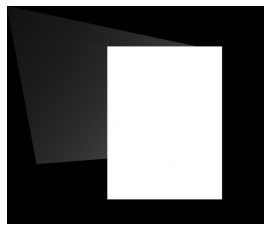

In [55]:
for y in range(0, h1):
    for x in range(0, w1):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        if tx<canvas3.shape[1] and ty<canvas3.shape[0] and tx>0 and ty>0:
            canvas3[ty,tx]=im1_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas3)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

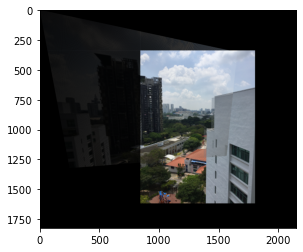

In [56]:
plt.imshow(canvas3/255)

In [210]:
#im2_interpolate.shape

(4800, 6400, 3)

In [201]:
#H23

array([[ 1.28551855e-03,  4.55287041e-05, -9.41988773e-01],
       [ 1.25432176e-04,  1.17276050e-03, -3.35621534e-01],
       [ 6.04047094e-07,  1.09882888e-07,  3.50592066e-03]])

In [202]:
#H12

array([[ 8.08286449e-04, -3.36354287e-05, -9.56602535e-01],
       [ 1.97891855e-04,  6.63078119e-04, -2.91390363e-01],
       [ 6.95433494e-07, -5.34618529e-08,  1.45327166e-03]])

In [211]:
#np.matmul(H23,H12)

array([[ 3.92986437e-07,  3.73105853e-08, -2.61196251e-03],
       [ 1.00062423e-07,  7.91355813e-07, -9.49469109e-04],
       [ 2.94812266e-09, -1.34889459e-10,  4.48520332e-06]])

In [210]:
#np.dot(H23,H12)

array([[ 3.92986437e-07,  3.73105853e-08, -2.61196251e-03],
       [ 1.00062423e-07,  7.91355813e-07, -9.49469109e-04],
       [ 2.94812266e-09, -1.34889459e-10,  4.48520332e-06]])

In [203]:
#H13

array([[ 1.03906722e-06, -1.53137748e-09,  9.01108849e-01],
       [ 2.48220059e-08,  7.77631829e-07,  9.77968807e-02],
       [ 4.20074581e-13, -5.87454279e-15,  5.09505512e-06]])

# Stitching all images together

The necessary homography matrices required are computed using those obtained from above. These matrices are then used to stich each image to image 3
i)Image 1 has been interpolated and scaled by a factor of 18
ii)Image 2 has been interpolated and scaled by a factor of 4
iii)Image 3 remains in the same size
iv)Image 4 has been interpolated and scaled by a factor of 2
v) Image 5 has been interpolated and scaled by a factor of 4

In [346]:
H13=np.dot(H23,H12)
H43=linalg.inv(H34)
H35 = np.dot(H45 , H34)
H53=linalg.inv(H35)

In [347]:
im1=plt.imread('im01.jpg')
im1=cv2.resize(im1,(320,240))
im1_interpolate=cv2.resize(im1,(18*im1.shape[1],18*im1.shape[0]),fx=18, fy=18, interpolation=cv2.INTER_CUBIC)
h1,w1=im1_interpolate.shape[0:2]
vertex1 = np.array([[0, 0, 1], [0, h1, 1], [w1, 0, 1], [w1, h1, 1]])

im2=plt.imread('im02.jpg')
im2=cv2.resize(im2,(320,240))
im2_interpolate=cv2.resize(im2,(4*im2.shape[1],4*im2.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
h2,w2=im2_interpolate.shape[0:2]
vertex2 = np.array([[0, 0, 1], [0, h2, 1], [w2, 0, 1], [w2, h2, 1]])

im3=plt.imread('im03.jpg')
im3=cv2.resize(im3,(320,240))
#im3_interpolate=cv2.resize(im3,(4*im3.shape[1],4*im3.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
h3,w3=im3.shape[0:2]
vertex3 = np.array([[0, 0, 1], [0, h3, 1], [w3, 0, 1], [w3, h3, 1]])

im4=plt.imread('im04.jpg')
im4=cv2.resize(im4,(320,240))
im4_interpolate=cv2.resize(im4,(2*im4.shape[1],2*im4.shape[0]),fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
h4,w4=im4_interpolate.shape[0:2]
vertex4 = np.array([[0, 0, 1], [0, h4, 1], [w4, 0, 1], [w4, h4, 1]])

im5=plt.imread('im05.jpg')
im5=cv2.resize(im5,(240,320))
im5_interpolate=cv2.resize(im5,(4*im5.shape[1],4*im5.shape[0]),fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
h5,w5=im5_interpolate.shape[0:2]
vertex5 = np.array([[0, 0, 1], [0, h5, 1], [w5, 0, 1], [w5, h5, 1]])


Obtaining the canvas size:

In order to determine the canvas size, the transformation coordinates are computed for each image usig their correponding homography matrix. The canvas size is then fixed depending upon the maximum and minimum values of the transformed coordinates for every image.

In [348]:
pos1 = np.dot(H13 ,vertex1.T)
pos2= np.dot(H23 ,vertex2.T)
pos4= np.dot(H43 ,vertex4.T)
pos5= np.dot(H53 ,vertex5.T)


In [349]:
pos=np.hstack([pos1,pos2,pos4,pos5])
pos.shape


(3, 16)

In [350]:
row=(pos[1,:]/pos[2,:]).astype(int)
col=(pos[0,:]/pos[2,:]).astype(int)

col_min = min(col)
col_max = max(col)
row_min = min(row)
row_max = max(row)

In [351]:
row_min

-497

In [352]:
if col_min>1:
    col_min=1
if row_min>1:
    row_min=1

Defining the canvas

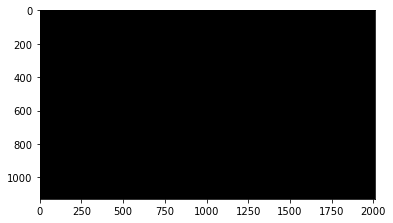

In [353]:
canvas = np.zeros([row_max-row_min+1, col_max-col_min+1, 3])
plt.imshow(canvas/255)

Placing image 3 onto the canvas:

In [354]:
for y in range(0,im3.shape[0]):
    
    for x in range(0,im3.shape[1]):
        
        tx2 = x - col_min
        ty2 = y -row_min
        if ty2<canvas.shape[0] and tx2<canvas.shape[1]:
            canvas[ty2,tx2] = im3[y,x]

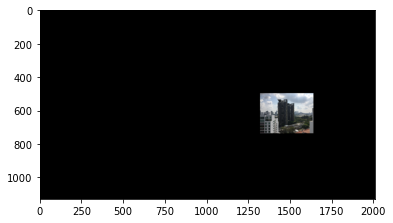

In [355]:
plt.imshow(canvas/255)

Stitching every image to canvas:
    i) Stitching image 1 to canvas using H13:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


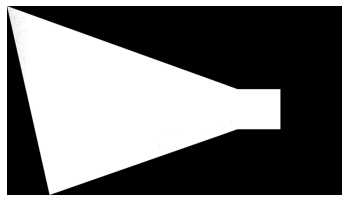

In [356]:
for y in range(0, h1):
    for x in range(0, w1):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H13* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        if tx<canvas.shape[1] and ty<canvas.shape[0] and tx>0 and ty>0:
            canvas[ty,tx]=im1_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

Stitching image 2 to 3 using H23

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


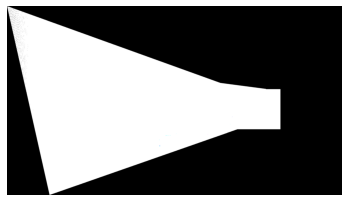

In [357]:
for y in range(0, h2):
    for x in range(0, w2):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H23* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        if tx<canvas.shape[1] and ty<canvas.shape[0] and tx>0 and ty>0:
            canvas[ty,tx]=im2_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

Stitching image 4 to canvas using H43:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


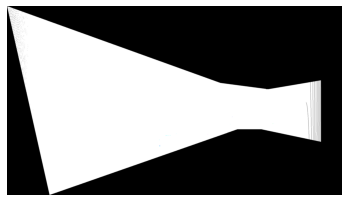

In [358]:
for y in range(0, h4):
    for x in range(0, w4):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H43* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        if tx<canvas.shape[1] and ty<canvas.shape[0] and tx>0 and ty>0:
            canvas[ty,tx]=im4_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

Stitching image 5 to canvas using H53 homography matrix:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


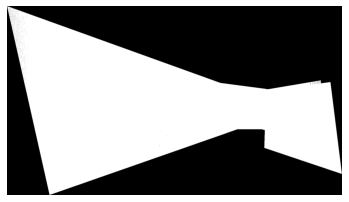

In [359]:
for y in range(0, h5):
    for x in range(0, w5):
        pixel = np.array([x,
                          y,
                          1])

        # Resource_pixel = np.asarray(np.asmatrix(inv_my_homo) * np.asmatrix(pixel))
        #Resource_pixel = np.asarray(np.asmatrix(My_Homography_arr) * np.asmatrix(pixel))
        Resource_pixel = np.asarray(H53* np.asmatrix(pixel).T)
        # Coordinate scale
        trans_x = Resource_pixel[0][0] / Resource_pixel[2][0]
        trans_y = Resource_pixel[1][0] / Resource_pixel[2][0]

        # Continue that pixels not matched
#         if (trans_x < 0 or trans_y < 0
#                 or trans_x > f2.shape[0] - 1 or trans_y > f2.shape[1] - 1):
            
# #        if (trans_x < 0 and trans_y < 0
# #                 and trans_x > f2.shape[0] - 1 and trans_y > f2.shape[1] - 1):
#              continue

        # divided by two parts with integer & decimal number
        tx = int(trans_x) -col_min
        ty = int(trans_y) -row_min
        a = trans_x - tx
        b = trans_y - ty
        
        if tx<canvas.shape[1] and ty<canvas.shape[0] and tx>0 and ty>0:
            canvas[ty,tx]=im5_interpolate[y,x]

        # Bilinear Interpolation
#         if ty+1<im1.shape[0] and tx+1<im1.shape[1]:
#             canvas1[ty][tx] = ((((1.0 - a) * (1.0 - b)) * im1[ty,tx])
#                          + ((a * (1.0 - b)) * im1[ty,tx + 1])
#                          + ((a * b) * im1[ty + 1,tx + 1])
#                          + (((1.0 - a) * b) * im1[ty + 1,tx]))

# Image stitch
# M, N = f1.shape[:2]
# f_stitched = np.copy(warped)
#f_stitched[0:M, 0:N, :] = f1

# Plot
# plt.subplot(221)
# plt.imshow(f1)
# plt.axis('off')
# coordinates_2=np.array(coordinates_2)
# coordinates_1=np.array(coordinates_1)
# plt.scatter(coordinates_2[:, 0], coordinates_2[:, 1], marker='x')
# plt.subplot(222)
# plt.imshow(f2)
# plt.axis('off')
# plt.scatter(coordinates_1[:, 0], coordinates_1[:, 1], marker='x')
# plt.subplot(223)
plt.imshow(canvas)
plt.axis('off')
#plt.subplot(224)
#plt.imshow(f_stitched)
#plt.axis('off')
plt.show()

Plotting Canvas containing all images stitched together:

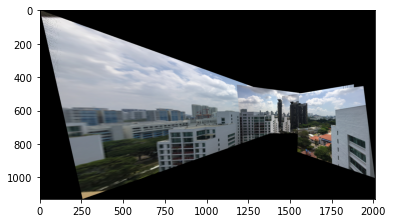

In [360]:
plt.imshow(canvas/255)